## Foursquare Places

La **API** de **Foursquare Places** nos permite retornar información de lugares, tiendas, restaurantes, museos...

Para poder usar la **API** vamos a necesitar tener un **`API_KEY`**, una llave única de 48 caracteres que nos va a permitir hacer llamadas y retornar información.

Para tener una **`API_KEY`** es necesario registrarse en la página de **Foursquare** como **desarrolladores** e iniciar un proyecto.

_**Foursquare Developers**_: https://developer.foursquare.com/


_**Documentación**_: https://developer.foursquare.com/reference/place-search


### Endpoints

En **Foursquare Places** tenemos diferentes endpoints, comenzaremos con **Search**:

```html
https://api.foursquare.com/v3/places/search
```
Este endpoint nos retorna información sobre lugares, como: ubicación, nombre, latitud y longitud, categoría, entre otras cosas.

Para hacer la búsqueda vamos a añadir los siguiente parámetros:
- **query** : **string**
    - A string to be matched against all content for this place, including but not limited to venue name, category, taste, and tips.


- **ll** : **string**
    - The latitude/longitude around which to retrieve place information. This must be specified as latitude,longitude (e.g., ll=41.8781,-87.6298).


- **radius** : **int32**
    - Defines the distance (in meters) within which to bias place results. The maximum allowed radius is 100,000 meters. Radius is used with ll or ip biased geolocation only.


- **categories** : **string**
    - Filters the response and returns FSQ Places matching the specified categories. Supports multiple Category IDs, separated by commas. For a complete list of Foursquare Category IDs, refer to the [Category Taxonomy](https://developer.foursquare.com/docs/categories) page.


- **chains** : **string**
    - Filters the response and returns FSQ Places matching the specified chains. Supports multiple chain IDs, separated by commas.


- **exclude_chains** : **string**
    - Filters the response and returns FSQ Places not matching any of the specified chains. Supports multiple chain IDs, separated by commas.


- **exclude_all_chains** : **boolean**
    - Filters the response by only returning FSQ Places that are not known to be part of any chain.


- **fields** : **string**
    - Indicate which fields to return in the response, separated by commas. If no fields are specified, all Core Fields are returned by default. For a complete list of returnable fields, refer to the [Response Fields](https://developer.foursquare.com/reference/response-fields) page.


- **min_price** : **int32**
    - Restricts results to only those places within the specified price range. Valid values range between 1 (most affordable) to 4 (most expensive), inclusive.


- **max_price** : **int32**
    - Restricts results to only those places within the specified price range. Valid values range between 1 (most affordable) to 4 (most expensive), inclusive.


- **open_at** : **string**
    - Support local day and local time requests through this parameter. To be specified as DOWTHHMM (e.g., 1T2130), where DOW is the day number 1-7 (Monday = 1, Sunday = 7) and time is in 24 hour format. Places that do not have opening hours will not be returned if this parameter is specified.


- **open_now** : **boolean**
    - Restricts results to only those places that are open now. Places that do not have opening hours will not be returned if this parameter is specified.


- **ne** : **string**
    - The latitude/longitude representing the north/east points of a rectangle. Must be used with sw parameter to specify a rectangular search box.


- **sw** : **string**
    - The latitude/longitude representing the south/west points of a rectangle. Must be used with ne parameter to specify a rectangular search box.


- **near** : **string**
    - A string naming a locality in the world (e.g., "Chicago, IL"). If the value is not geocodable, returns an error.


- **sort** : **string**
    - Specifies the order in which results are listed. Possible values are:

        - relevance (default)
        - rating
        - distance


- **limit** : **int32**
    - The number of results to return, up to 50. Defaults to 10.


- **session_token** : **string**
    - A user-generated token to identify a session for billing purposes. Learn more about session tokens.

In [1]:
import numpy as np
import pandas as pd

import requests
from pprint import pprint

import folium

In [2]:
with open ('src/foursquare_api_key.txt', 'r') as file:
    secrets = file.read()


In [12]:
{secreto.split(' = ')[0]: secreto.split(' = ')[1] for secreto in secrets.split('\n')}

{'CLIENT_ID': 'E5YKBTRMINTG0UU5RFQEJ0BTJVNXDLPCAVTSABP3WIORG3SU',
 'CLIENT_SECRET': 'EF1HMTDWMLUV4KKFWJJOXXHVARYIFMFKWUBARFBEULSJWNCB',
 'API_KEY': 'fsq3FzehSlFsh5dZCKRJsFzbFNFigXCy6wlyPUA/PBDIryQ='}

In [ ]:
{k:v for k,v in dict.items()}

In [3]:
# Credenciales

credentials = (
    {
    secreto.split(' = ')[0]:secreto.split(' = ')[1] 
    for secreto in secrets.split('\n')
    }
)


In [4]:
credentials

{'CLIENT_ID': 'E5YKBTRMINTG0UU5RFQEJ0BTJVNXDLPCAVTSABP3WIORG3SU',
 'CLIENT_SECRET': 'EF1HMTDWMLUV4KKFWJJOXXHVARYIFMFKWUBARFBEULSJWNCB',
 'API_KEY': 'fsq3FzehSlFsh5dZCKRJsFzbFNFigXCy6wlyPUA/PBDIryQ='}

In [5]:
credentials['API_KEY']

'fsq3FzehSlFsh5dZCKRJsFzbFNFigXCy6wlyPUA/PBDIryQ='

In [6]:
def get_secrets(path:str)->dict:
    '''
    This functions receives a text file with the secrets of an API, and returns it
    '''
    with open (path, 'r') as file:
        secrets = file.read()
    credentials = (
        {
        secreto.split(' = ')[0]:secreto.split(' = ')[1] 
        for secreto in secrets.split('\n')
        }
    )
    
    return credentials

In [7]:
credentials = get_secrets('src/foursquare_api_key.txt')
credentials

{'CLIENT_ID': 'E5YKBTRMINTG0UU5RFQEJ0BTJVNXDLPCAVTSABP3WIORG3SU',
 'CLIENT_SECRET': 'EF1HMTDWMLUV4KKFWJJOXXHVARYIFMFKWUBARFBEULSJWNCB',
 'API_KEY': 'fsq3FzehSlFsh5dZCKRJsFzbFNFigXCy6wlyPUA/PBDIryQ='}

In [13]:
credentials['API_KEY']

'fsq3FzehSlFsh5dZCKRJsFzbFNFigXCy6wlyPUA/PBDIryQ='

In [19]:
# Llamada al API

# Base del Endpoint
search_url = "https://api.foursquare.com/v3/places/search"

# Parametros
query = "football stadium"

near = "spain"

limit = 15

# Endpoint
endpoint = f"{search_url}?query={query}&near={near}&limit={limit}"

print(f"Endpoint: {endpoint}")

# Headers
# Para poder usar el API tenemos que autenticarnos usando el "API_KEY"
# Por eso debemos crear una nueva variable "headers"
# Este diccionario tendrá la información de los permisos necesarios.

headers = {"accept"        : "application/json", 
           "Authorization" : credentials['API_KEY']
          }

headers

# Request
# Agregamos el parámetro "headers"
response = requests.get(url = endpoint, headers = headers)

print(f"response: {response.status_code}")

print(response.json())

Endpoint: https://api.foursquare.com/v3/places/search?query=football stadium&near=spain&limit=15
response: 200
{'results': [{'fsq_id': '4f253f0be4b0831877670b5e', 'categories': [{'id': 10051, 'name': 'Stadium', 'short_name': 'Stadium', 'plural_name': 'Stadiums', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/arts_entertainment/stadium_', 'suffix': '.png'}}], 'chains': [], 'closed_bucket': 'LikelyOpen', 'distance': 316759, 'geocodes': {'main': {'latitude': 39.450852, 'longitude': -0.362879}, 'roof': {'latitude': 39.450852, 'longitude': -0.362879}}, 'link': '/v3/places/4f253f0be4b0831877670b5e', 'location': {'address': 'Angel Villena, s/n', 'admin_region': 'Comunidad Valenciana', 'country': 'ES', 'formatted_address': 'Angel Villena, s/n, 46013 València Comunitat Valenciana', 'locality': 'València', 'postcode': '46013', 'region': 'Comunitat Valenciana'}, 'name': 'Polideportivo Quatre Carreres', 'related_places': {}, 'timezone': 'Europe/Madrid'}, {'fsq_id': '4e441d171495455b10c

In [20]:
# Usando pprint

pprint(response.json()["results"][3])

{'categories': [{'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/arts_entertainment/stadium_',
                          'suffix': '.png'},
                 'id': 10051,
                 'name': 'Stadium',
                 'plural_name': 'Stadiums',
                 'short_name': 'Stadium'}],
 'chains': [],
 'closed_bucket': 'VeryLikelyOpen',
 'distance': 386651,
 'fsq_id': '4bb5fbba6edc76b03b3a301c',
 'geocodes': {'main': {'latitude': 43.476276, 'longitude': -3.793332}},
 'link': '/v3/places/4bb5fbba6edc76b03b3a301c',
 'location': {'address': 'Real Racing Club, s/n',
              'admin_region': 'Cantabria',
              'country': 'ES',
              'formatted_address': 'Real Racing Club, s/n, 39005 Santander '
                                   'Cantabria',
              'locality': 'Santander',
              'postcode': '39005',
              'region': 'Cantabria'},
 'name': 'Campos de Sport de el Sardinero',
 'related_places': {'children': [{'categories': [{'icon': {

In [21]:
pprint(response.json())

{'context': {'geo_bounds': {'circle': {'center': {'latitude': 40.0,
                                                  'longitude': -4.0},
                                       'radius': 714039}}},
 'results': [{'categories': [{'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/arts_entertainment/stadium_',
                                       'suffix': '.png'},
                              'id': 10051,
                              'name': 'Stadium',
                              'plural_name': 'Stadiums',
                              'short_name': 'Stadium'}],
              'chains': [],
              'closed_bucket': 'LikelyOpen',
              'distance': 316759,
              'fsq_id': '4f253f0be4b0831877670b5e',
              'geocodes': {'main': {'latitude': 39.450852,
                                    'longitude': -0.362879},
                           'roof': {'latitude': 39.450852,
                                    'longitude': -0.362879}},
              'link

In [22]:
# Por defecto, Foursquare nos retorna los primero 50 resultados

len(response.json()["results"])

15

In [23]:
# Usando "url_params"

search_url = "https://api.foursquare.com/v3/places/search"

# "url_params" es un diccionario que tendrá todos los parámetros de nuestra búsqueda
# Nos ayuda a tener el código más limpio y es fácil de utilizar al momento de hacer la llamada a la API.

url_params = {"query"    : "football stadium",
              "ll"       : "40.4167,-3.7042",
              "open_now" : None,
              "limit"    : 50,
              "radius"   : 100_000,
              "category" : None}

headers = {"accept"       : "application/json", 
           "Authorization": credentials['API_KEY']}

# Como ahora usamos una variable para los parámetros, debemos agregarlos con el parámetro "params"
response = requests.get(url = search_url, params = url_params, headers = headers)

# El método ".get()" le dará el formato a el endpoint usando los "key : value" del diccionario "url_params"
print(f"endpoint: {response.url}")

print(f"response: {response.status_code}")

print(response.json())

endpoint: https://api.foursquare.com/v3/places/search?query=football+stadium&ll=40.4167%2C-3.7042&limit=50&radius=100000
response: 200
{'results': [{'fsq_id': '50451f1bc84c761727c68ad8', 'categories': [{'id': 10051, 'name': 'Stadium', 'short_name': 'Stadium', 'plural_name': 'Stadiums', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/arts_entertainment/stadium_', 'suffix': '.png'}}], 'chains': [], 'closed_bucket': 'VeryLikelyOpen', 'distance': 10821, 'geocodes': {'main': {'latitude': 40.467535, 'longitude': -3.595061}}, 'link': '/v3/places/50451f1bc84c761727c68ad8', 'location': {'admin_region': 'Comunidad de Madrid', 'country': 'ES', 'formatted_address': '28042 Madrid Madrid', 'locality': 'Madrid', 'postcode': '28042', 'region': 'Madrid'}, 'name': 'CD San Roque', 'related_places': {}, 'timezone': 'Europe/Madrid'}, {'fsq_id': '4baf7ffaf964a520ee043ce3', 'categories': [{'id': 10051, 'name': 'Stadium', 'short_name': 'Stadium', 'plural_name': 'Stadiums', 'icon': {'prefix': 'https

In [24]:
pprint(response.json())

{'context': {'geo_bounds': {'circle': {'center': {'latitude': 40.4167,
                                                  'longitude': -3.7042},
                                       'radius': 100000}}},
 'results': [{'categories': [{'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/arts_entertainment/stadium_',
                                       'suffix': '.png'},
                              'id': 10051,
                              'name': 'Stadium',
                              'plural_name': 'Stadiums',
                              'short_name': 'Stadium'}],
              'chains': [],
              'closed_bucket': 'VeryLikelyOpen',
              'distance': 10821,
              'fsq_id': '50451f1bc84c761727c68ad8',
              'geocodes': {'main': {'latitude': 40.467535,
                                    'longitude': -3.595061}},
              'link': '/v3/places/50451f1bc84c761727c68ad8',
              'location': {'admin_region': 'Comunidad de Madrid',
   

In [25]:
response.json()["results"][0].get("fsq_idqwerghjk")

Ya con la información en una variable, podemos darle formato de **DataFrame**.

In [26]:
data = response.json()

data_df = list()

for r in data["results"]:

    fsq_id = r["fsq_id"]
    category = r["categories"][0]["name"]
    latitude = r["geocodes"]["main"]["latitude"]
    longitude = r["geocodes"]["main"]["longitude"]
    location = r["location"]["formatted_address"]
    postcode = r["location"].get("postcode")
    name = r["name"]
    
    data_df.append([name, category, latitude, longitude, location, postcode, fsq_id])
    
df = pd.DataFrame(data = data_df, columns = ["name", "category", "latitude", "longitude", "location", "postcode", "fsq_id"])

df

,name,category,latitude,longitude,location,postcode,fsq_id
0,CD San Roque,Stadium,40.467535,-3.595061,28042 Madrid Madrid,28042,50451f1bc84c761727c68ad8
1,Campo de las Adelfas,Stadium,40.403223,-3.668915,Campo,None,4baf7ffaf964a520ee043ce3
2,Fondo de Vallekas,Stadium,40.392257,-3.659004,Madrid Madrid,None,4f243acbe4b06176441781d0
3,A.D. Villarosa,Stadium,40.470494,-3.635658,28043 Madrid Madrid,28043,4dbefbba1e72b351caed7801
4,Tienda Club Deportivo Leganés,Stadium,40.340558,-3.760618,"Calle Arquitectura, s/n, 28918 Leganés Madrid",28918,5847fc1fac13696959db67f5
5,Campo de las Huertas,Stadium,40.342198,-3.819273,"Calle Polvoranca, 68, 28923 Alcorcón Madrid",28923,4cb9a6c27148f04d29c6d7ab
6,Escuela municipal de fútbol,Stadium,40.455987,-3.863410,,None,53132908498e32f2d25419aa
7,Campo de fútbol el Nacedero,Stadium,40.404052,-3.872938,"Avenida de España, s/n, Boadilla del Monte Madrid",None,4c16d95d127f95216d4d2525
8,Estadio Municipal de San Fernando de Henares,Stadium,40.429538,-3.521596,"Camino Pinos, s/n, 28830 San Fernando de Henar...",28830,52c92a2e498e42e895abc54d
9,Valle del Arcipreste/atletismo -Rugby,Stadium,40.471708,-3.878438,"Avenida Valle del Arcipreste, s/n, 28229 Majad...",28229,4bf90b3b4a67c9286d4626cf


In [28]:
df2 = df.dropna()

Ahora, podemos mostrar toda esta información en un mapa de **Folium**.

In [40]:
import folium

mad_ll = (40.4167, -3.7042)

mad_map = folium.Map(location = mad_ll, zoom_start = 10)

stadiums = folium.map.FeatureGroup()

for lat, lng, name, category in zip(df2["latitude"], df2["longitude"], df2["name"], df2["category"]):
    
    stadiums.add_child(folium.Marker(location = [lat, lng],
                                    popup    = f"{name}, <font color='red'></br><b>{category}</b>"))
    
mad_map.add_child(stadiums)

mad_map

### Endpoints

**Details**: Retorna información de un lugar, utilizando su **`fsq_id`**:

```html
https://api.foursquare.com/v3/places/{fsq_id}
```
_**Documentación**_: https://developer.foursquare.com/reference/place-details

No tiene parámetros, las llamadas las hacemos usando directamente el **`fsq_id`**.

La información que retorna es la misma que la retornada por **Search**, solo que es la información de un único lugar. 

In [41]:
fsq_id = "4adcda38f964a5205d3c21e3"

details_url = f"https://api.foursquare.com/v3/places/{fsq_id}"

headers = {"accept": "application/json", 
           "Authorization": credentials['API_KEY']}

response = requests.get(url = details_url, headers = headers)

print(f"endpoint: {response.url}")

print(f"response: {response.status_code}")

print(response.json())

endpoint: https://api.foursquare.com/v3/places/4adcda38f964a5205d3c21e3
response: 200
{'fsq_id': '4adcda38f964a5205d3c21e3', 'categories': [{'id': 10051, 'name': 'Stadium', 'short_name': 'Stadium', 'plural_name': 'Stadiums', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/arts_entertainment/stadium_', 'suffix': '.png'}}], 'chains': [], 'closed_bucket': 'VeryLikelyOpen', 'geocodes': {'main': {'latitude': 40.453026, 'longitude': -3.688322}, 'roof': {'latitude': 40.453001, 'longitude': -3.688344}}, 'link': '/v3/places/4adcda38f964a5205d3c21e3', 'location': {'address': 'Avenida de Concha Espina, 1', 'address_extended': 'P. de La Castellana', 'admin_region': 'Comunidad de Madrid', 'country': 'ES', 'cross_street': 'P. de La Castellana', 'formatted_address': 'Avenida de Concha Espina, 1 (P. de La Castellana), 28036 Madrid Madrid', 'locality': 'Madrid', 'postcode': '28036', 'region': 'Madrid'}, 'name': 'Santiago Bernabéu Stadium (Estadio Santiago Bernabéu)', 'related_places': {'chil

### Endpoints

**Photos**: Retorna imágenes de un lugar, utilizando su **`fsq_id`**:

```html

https://api.foursquare.com/v3/places/{fsq_id}/photos
```

_**Documentación**_: https://developer.foursquare.com/reference/place-photos

Tiene 3 parámetros para ordenar y filtrar los resultados:

- **limit : int32**
    - The specified number of photos per page. Returns 10 photos by default, up to a maximum number of 50.


- **sort : string**
    - Specifies the order in which results are listed. Possible values are:

        - popular (default) - sorts results based on their popularity among Foursquare users
        - newest - sorts results from most recently added to least recently added


- **classifications : string**
    - Restricts the results to photos matching the specified classifications, separated by a comma. Possible values are:

        - food - photos of food
        - indoor - photos of indoors
        - menu - photos of menus
        - outdoor - photos of storefronts, outdoors, and exteriors
        
        
_**Para manipular las imágenes de Foursquare**_: https://developer.foursquare.com/reference/places-photos-guide#assembling-a-photo-url

In [42]:
fsq_id = "4adcda38f964a5205d3c21e3"

url_params = {"limit"           : 50,
              "sort"            : "newest",
              "classifications" : None} 

details_url = f"https://api.foursquare.com/v3/places/{fsq_id}/photos"

headers = {"accept": "application/json", 
           "Authorization":credentials['API_KEY']}

response = requests.get(url = details_url, params = url_params, headers = headers)

print(f"endpoint: {response.url}")

print(f"response: {response.status_code}")

print(response.json())

endpoint: https://api.foursquare.com/v3/places/4adcda38f964a5205d3c21e3/photos?limit=50&sort=newest
response: 200
[{'id': '6536a73bd412e22066a00cf9', 'created_at': '2023-10-23T17:02:51.000Z', 'prefix': 'https://fastly.4sqi.net/img/general/', 'suffix': '/503874507_tClFDpnY9T4Fqs7f1NhmHFLlH90Fu88o7ur3Yzk7CQE.jpg', 'width': 1080, 'height': 1920}, {'id': '6533aa0f0a27ba5ba2961d84', 'created_at': '2023-10-21T10:38:07.000Z', 'prefix': 'https://fastly.4sqi.net/img/general/', 'suffix': '/51841020_PEJW5dzQvC29nz0oeg_RkLNj2mowuzvHPpgrp0_dBeU.jpg', 'width': 1920, 'height': 1440}, {'id': '652fd8f3622cf07039db6c56', 'created_at': '2023-10-18T13:09:07.000Z', 'prefix': 'https://fastly.4sqi.net/img/general/', 'suffix': '/15918792_-i_QQVW8gXS0odukVLA2LreEU-SWu06IQkSe5TwJ9Kc.jpg', 'width': 1920, 'height': 1440}, {'id': '652bfac67db38543e98982d8', 'created_at': '2023-10-15T14:44:22.000Z', 'prefix': 'https://fastly.4sqi.net/img/general/', 'suffix': '/555130173_RqztyXivO9ROYomHprT8qTiTEARIFjknaG2UfOegh88.j

In [43]:
response.json()

[{'id': '6536a73bd412e22066a00cf9',
  'created_at': '2023-10-23T17:02:51.000Z',
  'prefix': 'https://fastly.4sqi.net/img/general/',
  'suffix': '/503874507_tClFDpnY9T4Fqs7f1NhmHFLlH90Fu88o7ur3Yzk7CQE.jpg',
  'width': 1080,
  'height': 1920},
 {'id': '6533aa0f0a27ba5ba2961d84',
  'created_at': '2023-10-21T10:38:07.000Z',
  'prefix': 'https://fastly.4sqi.net/img/general/',
  'suffix': '/51841020_PEJW5dzQvC29nz0oeg_RkLNj2mowuzvHPpgrp0_dBeU.jpg',
  'width': 1920,
  'height': 1440},
 {'id': '652fd8f3622cf07039db6c56',
  'created_at': '2023-10-18T13:09:07.000Z',
  'prefix': 'https://fastly.4sqi.net/img/general/',
  'suffix': '/15918792_-i_QQVW8gXS0odukVLA2LreEU-SWu06IQkSe5TwJ9Kc.jpg',
  'width': 1920,
  'height': 1440},
 {'id': '652bfac67db38543e98982d8',
  'created_at': '2023-10-15T14:44:22.000Z',
  'prefix': 'https://fastly.4sqi.net/img/general/',
  'suffix': '/555130173_RqztyXivO9ROYomHprT8qTiTEARIFjknaG2UfOegh88.jpg',
  'width': 1440,
  'height': 1920},
 {'id': '652bbb4f23eeb227bdfdac30'

In [44]:
data = response.json()

image_data = list()

for r in data:
    image_id = r["id"]
    created_at = r["created_at"]
    prefix = r["prefix"] + "original" # Hay que agregar "original" al url para poder visualizarlo.
    suffix = r["suffix"]
    
    image_data.append([image_id, prefix + suffix, created_at])
    
df_image = pd.DataFrame(data = image_data, columns = ["id", "image_url", "created_at"])

df_image

,id,image_url,created_at
0,6536a73bd412e22066a00cf9,https://fastly.4sqi.net/img/general/original/5...,2023-10-23T17:02:51.000Z
1,6533aa0f0a27ba5ba2961d84,https://fastly.4sqi.net/img/general/original/5...,2023-10-21T10:38:07.000Z
2,652fd8f3622cf07039db6c56,https://fastly.4sqi.net/img/general/original/1...,2023-10-18T13:09:07.000Z
3,652bfac67db38543e98982d8,https://fastly.4sqi.net/img/general/original/5...,2023-10-15T14:44:22.000Z
4,652bbb4f23eeb227bdfdac30,https://fastly.4sqi.net/img/general/original/4...,2023-10-15T10:13:35.000Z
5,6523ea0878e3dc3dfbd15130,https://fastly.4sqi.net/img/general/original/4...,2023-10-09T11:54:48.000Z
6,652195a33c5ec91cbdbdf234,https://fastly.4sqi.net/img/general/original/3...,2023-10-07T17:30:11.000Z
7,652188ac339d3460e85fcf3b,https://fastly.4sqi.net/img/general/original/4...,2023-10-07T16:34:52.000Z
8,651c444cb868fc0898352855,https://fastly.4sqi.net/img/general/original/4...,2023-10-03T16:41:48.000Z
9,6515707a68d02e54b0997c86,https://fastly.4sqi.net/img/general/original/4...,2023-09-28T12:24:26.000Z


In [45]:
for url in df_image["image_url"]:
    print(url)

https://fastly.4sqi.net/img/general/original/503874507_tClFDpnY9T4Fqs7f1NhmHFLlH90Fu88o7ur3Yzk7CQE.jpg
https://fastly.4sqi.net/img/general/original/51841020_PEJW5dzQvC29nz0oeg_RkLNj2mowuzvHPpgrp0_dBeU.jpg
https://fastly.4sqi.net/img/general/original/15918792_-i_QQVW8gXS0odukVLA2LreEU-SWu06IQkSe5TwJ9Kc.jpg
https://fastly.4sqi.net/img/general/original/555130173_RqztyXivO9ROYomHprT8qTiTEARIFjknaG2UfOegh88.jpg
https://fastly.4sqi.net/img/general/original/455837605_nbcT3dhla8x8XShiNxJymUvMb9RcmO2Vontgt6CRUi4.jpg
https://fastly.4sqi.net/img/general/original/496353699_qH6kvcwyc8_Xwn82roI0FHmgiVYy04i_qVoGa1CYe00.jpg
https://fastly.4sqi.net/img/general/original/384673825_0K2u4RfGfeDF9yO7MoGDqzQ5zpz7afLwVKz8M0qGYc4.jpg
https://fastly.4sqi.net/img/general/original/479696137_VUsi9Wef6UGxveCAo0KreN8HvCHmUqLcA-7i8-E4mqs.jpg
https://fastly.4sqi.net/img/general/original/411802525_bviRaxlVCNKKI62oPYtjfztDiQ9oThl_LQECz16KqZc.jpg
https://fastly.4sqi.net/img/general/original/455837605_ZpqKBvuEPUuakIdzMb1l

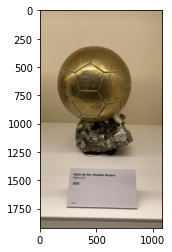

https://fastly.4sqi.net/img/general/original/503874507_tClFDpnY9T4Fqs7f1NhmHFLlH90Fu88o7ur3Yzk7CQE.jpg


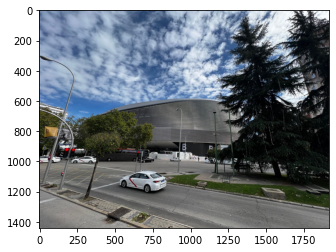

https://fastly.4sqi.net/img/general/original/51841020_PEJW5dzQvC29nz0oeg_RkLNj2mowuzvHPpgrp0_dBeU.jpg


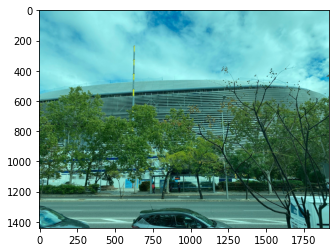

https://fastly.4sqi.net/img/general/original/15918792_-i_QQVW8gXS0odukVLA2LreEU-SWu06IQkSe5TwJ9Kc.jpg


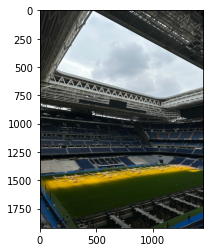

https://fastly.4sqi.net/img/general/original/555130173_RqztyXivO9ROYomHprT8qTiTEARIFjknaG2UfOegh88.jpg


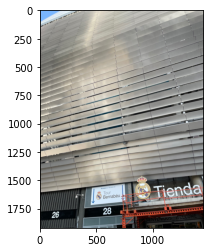

https://fastly.4sqi.net/img/general/original/455837605_nbcT3dhla8x8XShiNxJymUvMb9RcmO2Vontgt6CRUi4.jpg


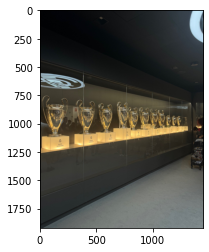

https://fastly.4sqi.net/img/general/original/496353699_qH6kvcwyc8_Xwn82roI0FHmgiVYy04i_qVoGa1CYe00.jpg


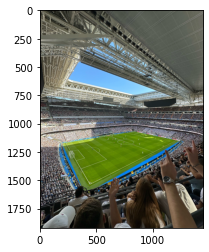

https://fastly.4sqi.net/img/general/original/384673825_0K2u4RfGfeDF9yO7MoGDqzQ5zpz7afLwVKz8M0qGYc4.jpg


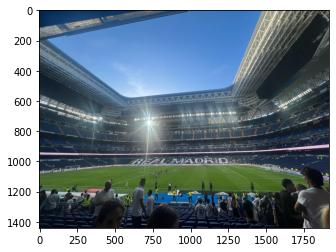

https://fastly.4sqi.net/img/general/original/479696137_VUsi9Wef6UGxveCAo0KreN8HvCHmUqLcA-7i8-E4mqs.jpg


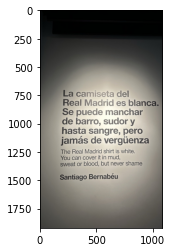

https://fastly.4sqi.net/img/general/original/411802525_bviRaxlVCNKKI62oPYtjfztDiQ9oThl_LQECz16KqZc.jpg


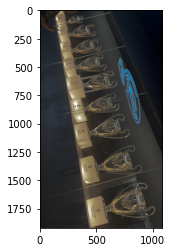

https://fastly.4sqi.net/img/general/original/455837605_ZpqKBvuEPUuakIdzMb1lEGn1iWLIF1P_GssU_3KScMI.jpg


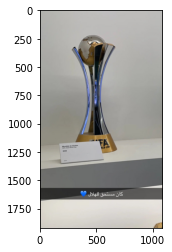

https://fastly.4sqi.net/img/general/original/455837605_J0lbvNf8yU1fqnImur4j_T7iBwr3RNzWVcOcSkUX2Kw.jpg


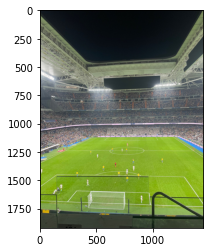

https://fastly.4sqi.net/img/general/original/596921337_OsIzq9kVQTtzlV4Mh8SAVEDz0XbYH_5Ig7Q0Vwa-tNY.jpg


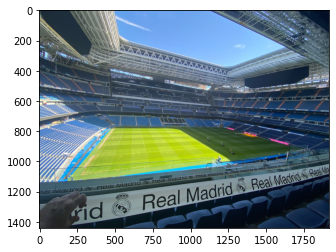

https://fastly.4sqi.net/img/general/original/24589062_PH--765sBYPqVg_vBU83YVk-y3XDKNjfVLePDRQayPU.jpg


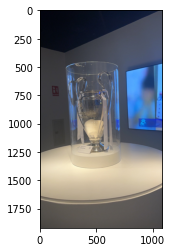

https://fastly.4sqi.net/img/general/original/467401304_zLoKDDWB4AKxfKQGyD2aX5KA_ryltcwmQI4yorN2Pb8.jpg


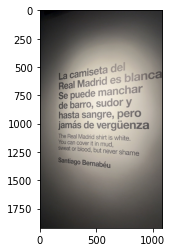

https://fastly.4sqi.net/img/general/original/467401304_kr77WJ3BzHTnqT6lZpqPfyRXxLrEJtR8OiexHPYppu8.jpg


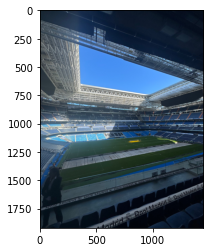

https://fastly.4sqi.net/img/general/original/455974560_JRkhG40G4I4g1Qb03VKadRnW4fUYJxfIYicassJDOOA.jpg


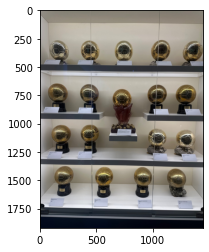

https://fastly.4sqi.net/img/general/original/455974560_cTBcbtWdFOpEojy860u3yGER42WgvW5q1FEztAA5rsg.jpg


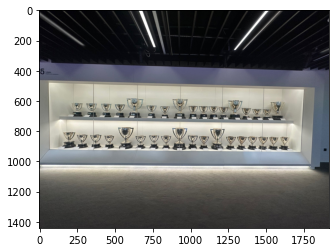

https://fastly.4sqi.net/img/general/original/455974560_Ho8BHzffEBc4Kq2m3UFoj_OQzvP-QH7aiv4O2uFhAv8.jpg


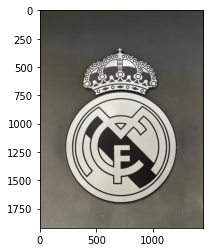

https://fastly.4sqi.net/img/general/original/455974560_PCs5t-bZH_xHOZMwbHBdAzIbY2hR9aSECAuth7Gypiw.jpg


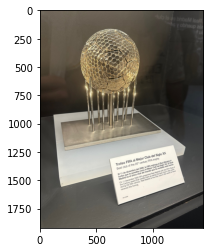

https://fastly.4sqi.net/img/general/original/455974560_XU9tjc9aFck7HcuPLnq5WR8o8WwP12V3SaRLv0L6tIw.jpg


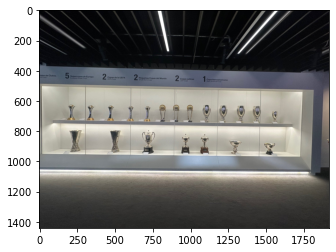

https://fastly.4sqi.net/img/general/original/455974560_mL_ItcG990AbaVmixeZShMXBgY9zQYsP4MHV6BVNXQ0.jpg


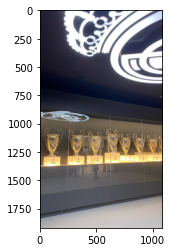

https://fastly.4sqi.net/img/general/original/571831340_xMIpBVL361ns-LF12K8plr1LVFT2lrf8zvWczyyaiwc.jpg


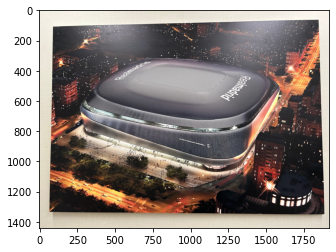

https://fastly.4sqi.net/img/general/original/7943459_cSz7KJ0Y8o0dq6JnbpxPzFcuFf9PkUR4--P3fzZiRjU.jpg


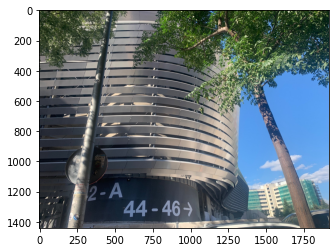

https://fastly.4sqi.net/img/general/original/519270224_m44SHGarE2V8JVct9ixiKVAtABMpPsBpwdZGTe4_a70.jpg


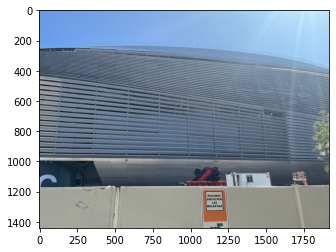

https://fastly.4sqi.net/img/general/original/74072749_czi64d5gnJX9W-B-3MOPoAbP4KV4jHfj3PjYh8r2KeM.jpg


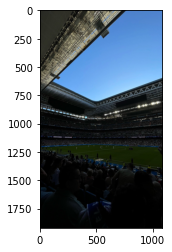

https://fastly.4sqi.net/img/general/original/396330341_BrachY_QKWCBRzP0W27zr7Hole3_PG_PMqnTsJfJadE.jpg


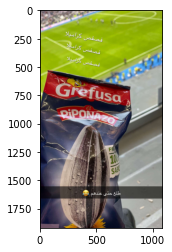

https://fastly.4sqi.net/img/general/original/45423869_5hs1_AgHgJlUDHKSr9-xoRB6Lyj6b9q0WbKYvaH3qXE.jpg


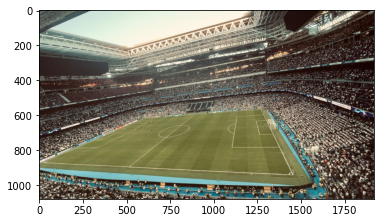

https://fastly.4sqi.net/img/general/original/1729279_T3fEVqYZ0j0idMMaztEG928ZilSADXofaP37651xvEU.jpg


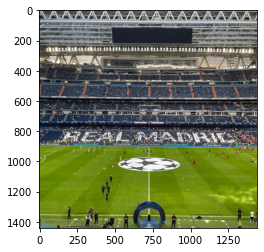

https://fastly.4sqi.net/img/general/original/520917026_bN0tBgDkY2XebbDeNtAQVRWhGnMESmwKQKhHCqc0No8.jpg


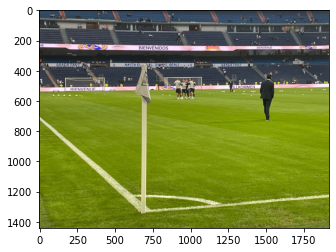

https://fastly.4sqi.net/img/general/original/16562554_iQcgen9vzqqH__HFVJ_s01Qtlh4iogNh7cn3Xqf6nDA.jpg


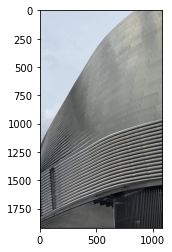

https://fastly.4sqi.net/img/general/original/80453746_KXaAbwc2lSz9o2TpL_aYt-WjBIdVaCR-XvOd8107FKc.jpg


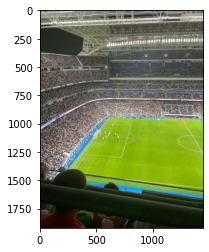

https://fastly.4sqi.net/img/general/original/569911721_5imUTonqjJ3r_DCYAX2iyoujjiaOw-LpH1v0hVACyWM.jpg


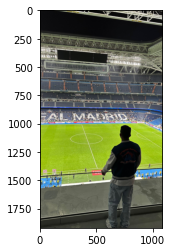

https://fastly.4sqi.net/img/general/original/1377834030_cJtz292jOIKSKRXAGroRojvnWhAGM_kgffLgRyOexWk.jpg


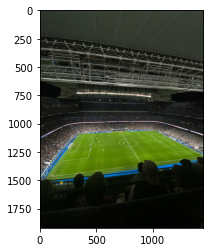

https://fastly.4sqi.net/img/general/original/418077131_9H4ZUWvlGW7Qub0BqB8VYJI7cM9hEAhXmp29SwAPiXk.jpg


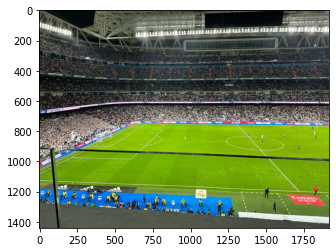

https://fastly.4sqi.net/img/general/original/563714594_3qFahbm-kBH0LRyK69tGh3mV3k4VBzDlGvC9piCoQb8.jpg


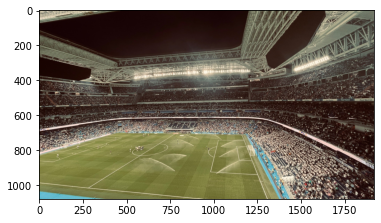

https://fastly.4sqi.net/img/general/original/1729279_Atm-tCkcL8-C5rGVhCKtETQEE8_JzspnZGUYwPAF1_c.jpg


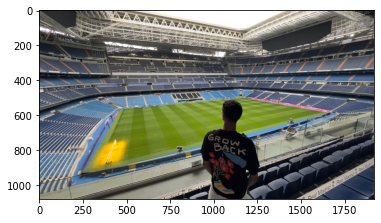

https://fastly.4sqi.net/img/general/original/447199794_nKDg0ADRwx03HOafgar2qjJuxTOC9mP7eU6sNuEcdn4.jpg


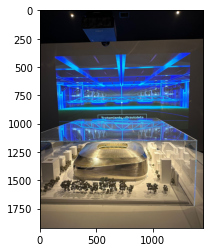

https://fastly.4sqi.net/img/general/original/1370183143_sA4pTivKZGV_1Cujl4-9iGbTG6pnedM32Aqi5bnx6wU.jpg


In [46]:
import urllib
import matplotlib.pyplot as plt

for url in df_image["image_url"]:
    
    f = urllib.request.urlopen(url)

    a = plt.imread(f, format = f".{url.split('.')[-1]}")
    plt.imshow(a)
    plt.show()
    
    print(url)

### Endpoints

**Tips**: Retorna "tips" o reseñas de un lugar dejados por lo usuarios, utilizando su **`fsq_id`**:

```html
https://api.foursquare.com/v3/places/{fsq_id}/tips
```
_**Documentación**_: https://developer.foursquare.com/reference/place-tips

Tiene 3 parámetros para controlar la información que retornamos:
- **limit : int32**
    - The specified number of tips per page. Returns 10 tips by default, up to a maximum number of 50.


- **fields : string**
    - Indicate which fields to return in the response, separated by commas. Supported fields are:

        - id - the ID of the tip
        - created_at - when was the tip created
        - text - what does the tip actually say?
        - lang - what language was the tip created in
        
    Default fields if this param is omitted are "id", "created_at", and "text".


- **sort : string**
    - Specifies the order in which results are listed. Possible values are:

        - popular (default) - sorts results based on their popularity among Foursquare users
        - newest - sorts results from most recently added to least recently added

In [47]:
fsq_id = "4adcda38f964a5205d3c21e3"

url_params = {"limit"  : 50,
              "fields" : "id,created_at,text,lang",
              "sort"   : "newest"} 

details_url = f"https://api.foursquare.com/v3/places/{fsq_id}/tips"

headers = {"accept": "application/json", 
           "Authorization": credentials['API_KEY']}

response = requests.get(url = details_url, params = url_params, headers = headers)

print(f"endpoint: {response.url}")

print(f"response: {response.status_code}")

print(response.json())

endpoint: https://api.foursquare.com/v3/places/4adcda38f964a5205d3c21e3/tips?limit=50&fields=id%2Ccreated_at%2Ctext%2Clang&sort=newest
response: 200
[{'id': '64c91acc17a1e43f5a6247fb', 'created_at': '2023-08-01T14:46:36.000Z', 'text': 'We like it although is was under maintenance.', 'lang': 'en'}, {'id': '63b47d422710d5140bd6b6ed', 'created_at': '2023-01-03T19:08:50.000Z', 'text': 'The tour allows you to enter the stadium and visit a temporary museum. Due to the renewal works, the dressing rooms were not open to the public.', 'lang': 'en'}, {'id': '62fe3e5fd2a5da0108c82402', 'created_at': '2022-08-18T13:27:59.000Z', 'text': 'Although they a are under construction right now, the official store is opened.', 'lang': 'en'}, {'id': '62337ac1c01adc53001a5171', 'created_at': '2022-03-17T18:15:29.000Z', 'text': 'Great Stadium', 'lang': 'en'}, {'id': '5d1f78e1681ae900232c9904', 'created_at': '2019-07-05T16:20:49.000Z', 'text': 'Nice experience', 'lang': 'en'}, {'id': '5d022502fe3740002c9c2468',

In [58]:
response.json()[1]

{'id': '5846f32983622d56606a762d',
 'created_at': '2016-12-06T17:19:37.000Z',
 'text': 'Dieciséisavos de Copa del Rey: Leganés-Valencia (1-3)',
 'lang': 'es'}

In [48]:
data = response.json()

tips_data = list()

for r in data:
    tips_id = r["id"]
    created_at = r["created_at"]
    text = r["text"]
    lang = r["lang"]
    
    tips_data.append([text, lang, created_at, tips_id])
    
df_tips = pd.DataFrame(data = tips_data, columns = ["text", "lang", "created_at", "tips_id"])

df_tips

,text,lang,created_at,tips_id
0,We like it although is was under maintenance.,en,2023-08-01T14:46:36.000Z,64c91acc17a1e43f5a6247fb
1,The tour allows you to enter the stadium and v...,en,2023-01-03T19:08:50.000Z,63b47d422710d5140bd6b6ed
2,Although they a are under construction right n...,en,2022-08-18T13:27:59.000Z,62fe3e5fd2a5da0108c82402
3,Great Stadium,en,2022-03-17T18:15:29.000Z,62337ac1c01adc53001a5171
4,Nice experience,en,2019-07-05T16:20:49.000Z,5d1f78e1681ae900232c9904
5,Spain again Zweden,en,2019-06-13T10:27:14.000Z,5d022502fe3740002c9c2468
6,If you have bananas in your backpack for your ...,en,2019-05-19T18:52:18.000Z,5ce1a5e2a42362002cae49a9
7,Nice stadium - all seats have good visibility ...,en,2019-05-19T18:50:28.000Z,5ce1a574a22db7002cbd7597
8,Fantastic stadium. Easy to enter the match.,en,2019-04-07T08:17:41.000Z,5ca9b225b77c770039cb1408
9,By far the best stadium in the world... it has...,en,2019-01-17T23:25:39.000Z,5c410ef36e4650002cda843c


In [49]:
for text in df_tips["text"]:
    print(text)
    print("*"*50)

We like it although is was under maintenance.
**************************************************
The tour allows you to enter the stadium and visit a temporary museum. Due to the renewal works, the dressing rooms were not open to the public.
**************************************************
Although they a are under construction right now, the official store is opened.
**************************************************
Great Stadium
**************************************************
Nice experience
**************************************************
Spain again Zweden
**************************************************
If you have bananas in your backpack for your baby to eat, security will make you peel all of them and throw away the peels to prevent the peels from dropping on the floor.
**************************************************
Nice stadium - all seats have good visibility and you can get to your seat in a quarter of the time it takes to get into most U.S. stadiums.  We found

#### Estadio Muncipal de Butarque - Leganes CF

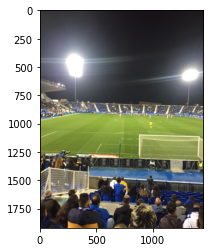

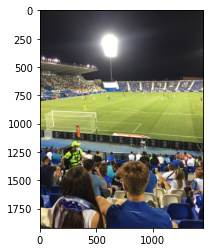

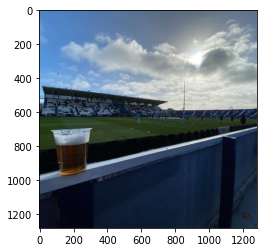

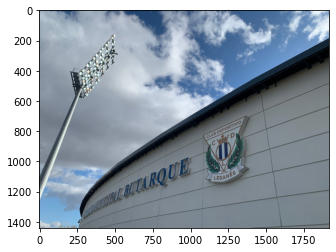

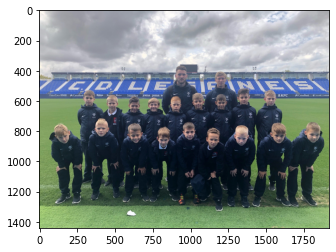

...

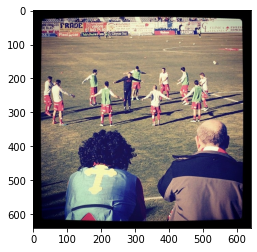

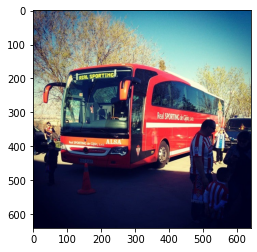

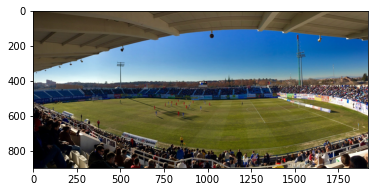

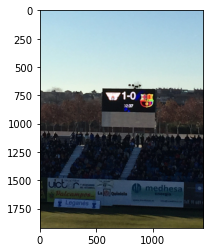

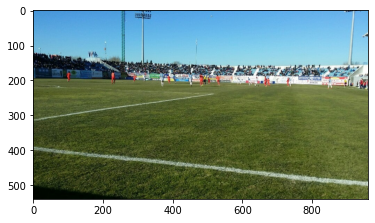

El campo contiguo que juegan los juveniles...Bar con espectaculares bocadillos a la brasa.
**************************************************
Dieciséisavos de Copa del Rey: Leganés-Valencia (1-3)
**************************************************
Ya somos de primera!
**************************************************
Campo de Futbol del CD Leganés
**************************************************
Nuevo video marcador
**************************************************
Una pena que el ayuntamiento no invierta en áreas de deporte en nuestra ciudad
**************************************************
El Estadio Municipal de Butarque ofrece la posibilidad de alquilar uno de sus campos para jugar un buen partido de futbol. Muy buenas instalaciones!
**************************************************
Coqueto estadio para un equipo de 2B. He mirado por todas partes pero no he encontrado al monstruo...de Leganés.
**************************************************
Aúpa Leganes
********************

In [50]:
# Photos
fsq_id = "4d862117e83fa1436bfa88a1"

url_params = {"limit"           : 50,
              "sort"            : "newest",
              "classifications" : None} 

details_url = f"https://api.foursquare.com/v3/places/{fsq_id}/photos"

headers = {"accept": "application/json", 
           "Authorization": credentials['API_KEY']}

response = requests.get(url = details_url, params = url_params, headers = headers)

data = response.json()

image_data = list()

for r in data:
    image_id = r["id"]
    created_at = r["created_at"]
    prefix = r["prefix"] + "original" # Hay que agregar "original" al url para poder visualizarlo.
    suffix = r["suffix"]
    
    image_data.append([image_id, prefix + suffix, created_at])
    
df_image = pd.DataFrame(data = image_data, columns = ["id", "image_url", "created_at"])

for url in df_image["image_url"]:
    
    f = urllib.request.urlopen(url)

    a = plt.imread(f, format = f".{url.split('.')[-1]}")
    plt.imshow(a)
    plt.show()
    
################################################################################

# Tips
url_params = {"limit"  : 50,
              "fields" : "id,created_at,text,lang",
              "sort"   : "newest"} 

details_url = f"https://api.foursquare.com/v3/places/{fsq_id}/tips"

headers = {"accept": "application/json", 
           "Authorization": credentials['API_KEY']}

response = requests.get(url = details_url, params = url_params, headers = headers)

data = response.json()

tips_data = list()

for r in data:
    tips_id = r["id"]
    created_at = r["created_at"]
    text = r["text"]
    lang = r["lang"]
    
    tips_data.append([text, lang, created_at, tips_id])
    
df_tips = pd.DataFrame(data = tips_data, columns = ["text", "lang", "created_at", "tips_id"])

for text in df_tips["text"]:
    
    print(text)
    print("*"*50)

In [ ]:
################################################################################################################################